In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from tqdm.autonotebook import tqdm
from joblib import Parallel, delayed
import umap
import pandas as pd

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/autonotebook/__init__.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


In [3]:
from avgn.utils.paths import DATA_DIR, most_recent_subdirectory, ensure_dir

In [4]:
DATASET_ID = 'BIRD_DB_Vireo_cassinii'

In [5]:
from avgn.utils.hparams import HParams
from avgn.dataset import DataSet

In [6]:
from avgn.signalprocessing.create_spectrogram_dataset import prepare_wav, create_label_df, get_row_audio

### create dataset

In [7]:
hparams = HParams(
    num_mel_bins = 32,
    mel_lower_edge_hertz=500,
    mel_upper_edge_hertz=10000,
    butter_lowcut = 500,
    butter_highcut = 10000,
    ref_level_db = 20,
    min_level_db = -30,
    mask_spec = True,
    win_length_ms = 10,
    hop_length_ms = 2,
    mask_spec_kwargs = {"spec_thresh": 0.9, "offset": 1e-10}
)

In [8]:
# create a dataset object
dataset = DataSet(DATASET_ID, hparams = hparams)

In [9]:
#dataset.data_files = {i:dataset.data_files[i] for i in list(dataset.data_files.keys())[:5]}

In [10]:
dataset.sample_json

OrderedDict([('TrackName', 'tFTANN1405-1586'),
             ('type_of_device', 'single microphone'),
             ('configuration', 'RL2013'),
             ('microphone',
              'Sennheiser omnidirectional with Telinga parabolic reflector'),
             ('recorder', 'Marantz PMD661'),
             ('sample_rate', 44.0),
             ('Recordist_first_name', 'Richard'),
             ('Recordist_last_name', 'Hedley'),
             ('recording_date', '2014-05-29_00-00-00'),
             ('recording_time', '10:10:00'),
             ('recording_length', '00:03:49'),
             ('Audio_file',
              'http://taylor0.biology.ucla.edu/birdDBQuery/Files/Tracks/2014/May/1586.WAV'),
             ('SubjectName', 'ORA'),
             ('subject_importance', 'Primary subject'),
             ('quality_rating', nan),
             ('Species_short_name', 'CAVI'),
             ('Subject_species', "Cassin's Vireo"),
             ('sex', 'Male(s)'),
             ('age_class', 'Reproductive a

In [11]:
len(dataset.data_files)

423

#### Create dataset based upon JSON

In [12]:
from joblib import Parallel, delayed
n_jobs = -1; verbosity = 10

In [13]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:
    syllable_dfs = parallel(
        delayed(create_label_df)(
            dataset.data_files[key].data,
            hparams=dataset.hparams,
            labels_to_retain=["labels"],
            unit="syllables",
            dict_features_to_retain = ['subject_importance'],
            key = key,
        )
        for key in tqdm(dataset.data_files.keys())
    )
syllable_df = pd.concat(syllable_dfs)
len(syllable_df)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   10.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:   10.9s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:   11.0s
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.2s
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:   11.2s
[Parallel(n_jobs=-1)]: Done  65 tasks      | elapsed:   11.3s
[Parallel(n_jobs=-1)]: Done  80 tasks      | elapsed:   11.3s
[Parallel(n_jobs=-1)]: Done  97 tasks      | elapsed:   11.4s
[Parallel(n_jobs=-1)]: Done 114 tasks      | elapsed:   11.5s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1993s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done 133 tasks      | elapsed:   11.6s
[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed:   11.7s
[Parallel(n_jobs=-1)]: Done 181 tasks      | elapsed:   11.8s
[Parallel(n_jobs=-1)]: Done 223 tasks      | elapsed:   12.0s
[Parallel(n_jobs=-1)]: Done 269 ta

[Parallel(n_jobs=-1)]: Done 419 out of 423 | elapsed:   12.8s remaining:    0.1s
[Parallel(n_jobs=-1)]: Done 423 out of 423 | elapsed:   12.8s finished


67357

In [14]:
syllable_df[:3]

,start_time,end_time,labels,indv,indvi,subject_importance,key
0,9.842790,10.105938,ah,ORA,0,Primary subject,2014-05-29_10-10-00-000000
1,72.031245,72.346332,ah,ORA,0,Primary subject,2014-05-29_10-10-00-000000
2,74.130176,74.376012,bz,ORA,0,Primary subject,2014-05-29_10-10-00-000000


### get audio for dataset

In [15]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:
    syllable_dfs = parallel(
        delayed(get_row_audio)(
            syllable_df[syllable_df.key == key], 
            dataset.data_files[key].data['wav_loc'], 
            dataset.hparams
        )
        for key in tqdm(syllable_df.key.unique())
    )
syllable_df = pd.concat(syllable_dfs)
len(syllable_df)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    5.3s
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/joblib/externals/loky/process_executor.py:706: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.6s
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:   13.9s
[Parallel(n_jobs=-1)]: Done  65 tasks      | elapsed:   17.6s
[Parallel(n_jobs=-1)]: Done  80 tasks      | elapsed:   21.8s
[Parallel(n_jobs=-1)]: Done  97 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 114 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 133 tasks      | elapsed:  1.2min
[Pa

[Parallel(n_jobs=-1)]: Done 418 out of 422 | elapsed:  3.6min remaining:    2.1s
[Parallel(n_jobs=-1)]: Done 422 out of 422 | elapsed:  3.7min finished


67357

In [16]:
df_mask  = np.array([len(i) > 0 for i in tqdm(syllable_df.audio.values)])

In [17]:
syllable_df = syllable_df[np.array(df_mask)]

In [18]:
syllable_df[:3]

,start_time,end_time,labels,indv,indvi,subject_importance,key,audio,rate
0,9.842790,10.105938,ah,ORA,0,Primary subject,2014-05-29_10-10-00-000000,"[-0.000579168229519144, -0.0006187996231798888...",44100
1,72.031245,72.346332,ah,ORA,0,Primary subject,2014-05-29_10-10-00-000000,"[-0.0003429692610176042, -0.000280866481722752...",44100
2,74.130176,74.376012,bz,ORA,0,Primary subject,2014-05-29_10-10-00-000000,"[-0.00024377675914189108, -0.00018548543687671...",44100


In [19]:
sylls = syllable_df.audio.values

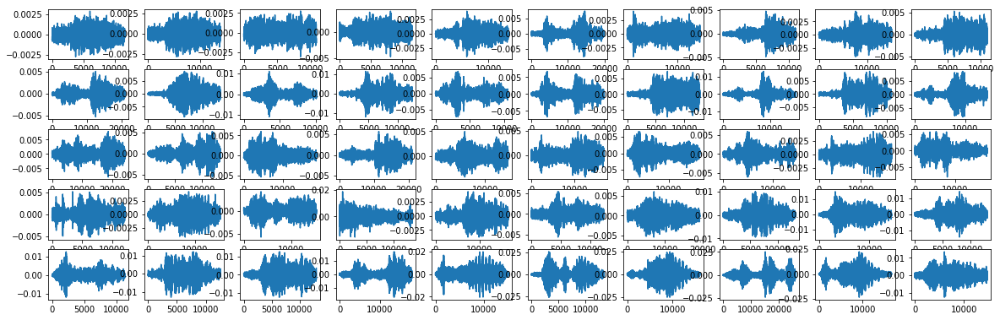

In [20]:
nrows = 5
ncols = 10
zoom = 2
fig, axs = plt.subplots(ncols=ncols, nrows = nrows,figsize = (ncols*zoom, nrows+zoom/1.5))
for i, syll in tqdm(enumerate(sylls), total = nrows*ncols):
    ax = axs.flatten()[i]
    ax.plot(syll)
    if i == nrows*ncols -1:
        break

In [21]:
syllable_df['audio'] = [i/np.max(i) for i in syllable_df.audio.values]

### Create spectrograms

In [22]:
from avgn.visualization.spectrogram import draw_spec_set
from avgn.signalprocessing.create_spectrogram_dataset import make_spec, mask_spec, log_resize_spec, pad_spectrogram

In [23]:
syllables_wav = syllable_df.audio.values
syllables_rate = syllable_df.rate.values

In [24]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:
    # create spectrograms
    syllables_spec = parallel(
        delayed(make_spec)(
            syllable,
            rate,
            hparams=dataset.hparams,
            mel_matrix=dataset.mel_matrix,
            use_mel=True,
            use_tensorflow=False,
        )
        for syllable, rate in tqdm(
            zip(syllables_wav, syllables_rate),
            total=len(syllables_rate),
            desc="getting syllable spectrograms",
            leave=False,
        )
    )

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1811s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1190s.) Setting batch_size=6.
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1629s.) Setting batch_size=14.
[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 342 tasks      | elapsed:

[Parallel(n_jobs=-1)]: Done 67032 out of 67032 | elapsed:   49.3s finished


### Rescale spectrogram
- using log rescaling

In [25]:
log_scaling_factor = 4

In [26]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:
    syllables_spec = parallel(
        delayed(log_resize_spec)(spec, scaling_factor=log_scaling_factor)
        for spec in tqdm(syllables_spec, desc="scaling spectrograms", leave=False)
    )

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0169s.) Setting batch_size=22.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1486s.) Setting batch_size=58.
[Parallel(n_jobs=-1)]: Done  92 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 422 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 752 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 1162 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 2148 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 3250 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 4352 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 5570 tasks      | elapsed:    1.3s
[Paral

[Parallel(n_jobs=-1)]: Done 67032 out of 67032 | elapsed:   11.8s finished


(25.0, 10) (320, 800) 25.0 32 800


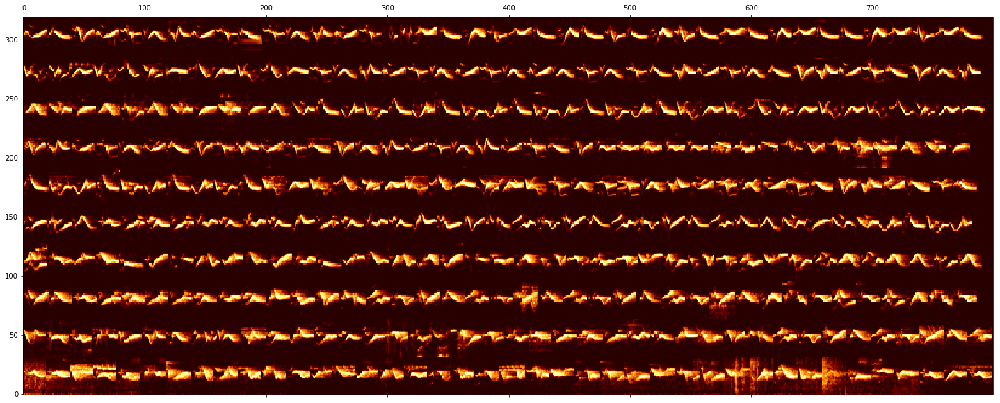

In [27]:
draw_spec_set(syllables_spec, zoom=1, maxrows=10, colsize=25)

### Pad spectrograms

In [28]:
syll_lens = [np.shape(i)[1] for i in syllables_spec]
pad_length = np.max(syll_lens)

In [29]:
syllable_df[:3]

,start_time,end_time,labels,indv,indvi,subject_importance,key,audio,rate
0,9.842790,10.105938,ah,ORA,0,Primary subject,2014-05-29_10-10-00-000000,"[-0.19927763130383222, -0.2129138251615996, -0...",44100
1,72.031245,72.346332,ah,ORA,0,Primary subject,2014-05-29_10-10-00-000000,"[-0.12207342570633199, -0.09996911527363203, -...",44100
2,74.130176,74.376012,bz,ORA,0,Primary subject,2014-05-29_10-10-00-000000,"[-0.0889848557398444, -0.06770700742932487, -0...",44100


In [30]:
import seaborn as sns

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


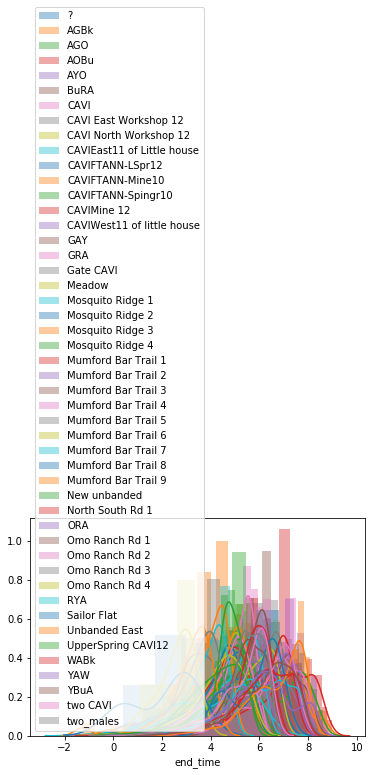

In [31]:
for indv in np.unique(syllable_df.indv):
    sns.distplot(np.log(syllable_df[syllable_df.indv==indv]["end_time"]), label=indv)
plt.legend()

In [32]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:

    syllables_spec = parallel(
        delayed(pad_spectrogram)(spec, pad_length)
        for spec in tqdm(
            syllables_spec, desc="padding spectrograms", leave=False
        )
    )

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1860s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0931s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0744s.) Setting batch_size=42.
[Parallel(n_jobs=-1)]: Done 288 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 440 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.

[Parallel(n_jobs=-1)]: Done 67032 out of 67032 | elapsed:    9.4s finished


(25.0, 10) (320, 800) 25.0 32 800


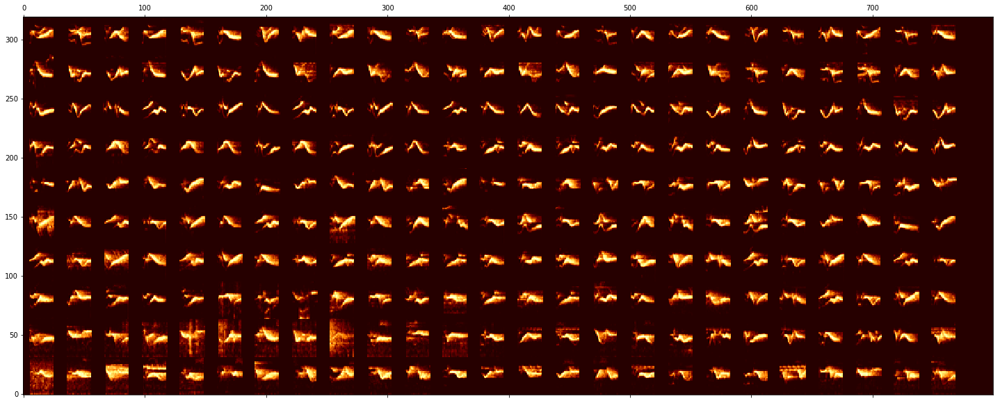

In [33]:
draw_spec_set(syllables_spec, zoom=1, maxrows=10, colsize=25)

In [34]:
np.shape(syllables_spec)

(67032, 32, 31)

In [35]:
syllable_df['spectrogram'] = syllables_spec

In [36]:
syllable_df[:3]

,start_time,end_time,labels,indv,indvi,subject_importance,key,audio,rate,spectrogram
0,9.842790,10.105938,ah,ORA,0,Primary subject,2014-05-29_10-10-00-000000,"[-0.19927763130383222, -0.2129138251615996, -0...",44100,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.3059005, 0.4..."
1,72.031245,72.346332,ah,ORA,0,Primary subject,2014-05-29_10-10-00-000000,"[-0.12207342570633199, -0.09996911527363203, -...",44100,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.12574787, 0.12236..."
2,74.130176,74.376012,bz,ORA,0,Primary subject,2014-05-29_10-10-00-000000,"[-0.0889848557398444, -0.06770700742932487, -0...",44100,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.2822944, 0.0..."


### view syllables per indv

In [37]:
syllable_df.indv.unique()

array(['ORA', 'CAVIFTANN-Spingr10', 'WABk', 'RYA', 'AOBu',
       'Mumford Bar Trail 4', 'AGO', 'YAW', 'GAY', 'AGBk', 'New unbanded',
       'YBuA', 'BuRA', 'Mumford Bar Trail 1', 'AYO', 'Mosquito Ridge 3',
       'Omo Ranch Rd 3', 'Mosquito Ridge 2', 'CAVIFTANN-LSpr12',
       'Mosquito Ridge 1', 'GRA', 'Mumford Bar Trail 2', 'Meadow', 'CAVI',
       'Mosquito Ridge 4', 'Unbanded East', 'CAVIWest11 of little house',
       'two CAVI', 'CAVIMine 12', 'Mumford Bar Trail 3',
       'Mumford Bar Trail 9', 'Omo Ranch Rd 4', 'Omo Ranch Rd 1',
       'Mumford Bar Trail 6', 'UpperSpring CAVI12', 'two_males', '?',
       'Gate CAVI', 'CAVI East Workshop 12', 'CAVIEast11 of Little house',
       'Mumford Bar Trail 7', 'Sailor Flat', 'North South Rd 1',
       'Mumford Bar Trail 8', 'CAVI North Workshop 12',
       'Mumford Bar Trail 5', 'Omo Ranch Rd 2', 'CAVIFTANN-Mine10'],
      dtype=object)

? 691
(50.0, 32) (512, 800) 25.0 32 800


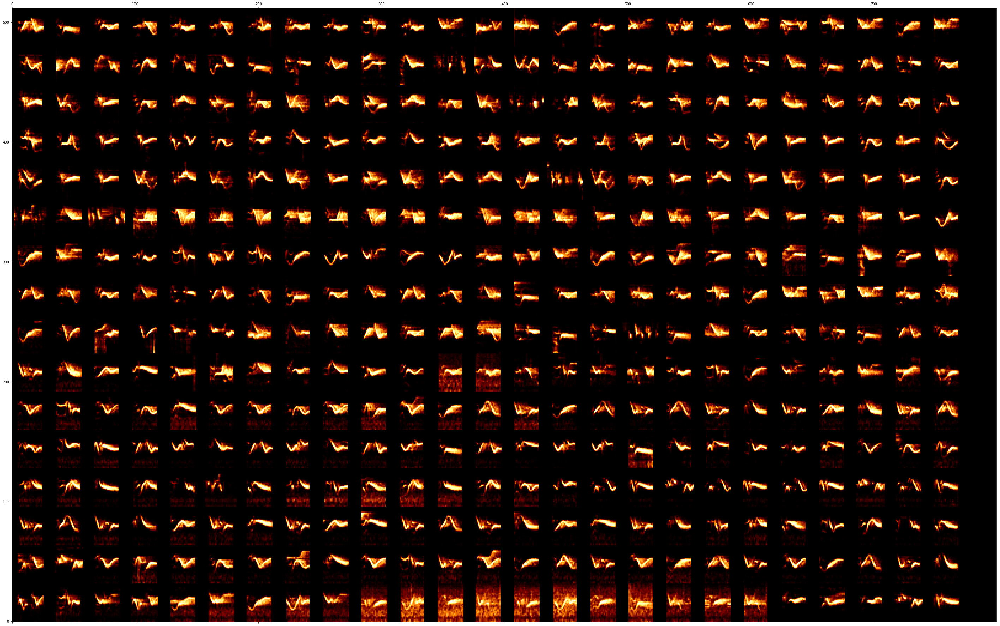

AGBk 9875
(50.0, 32) (512, 800) 25.0 32 800


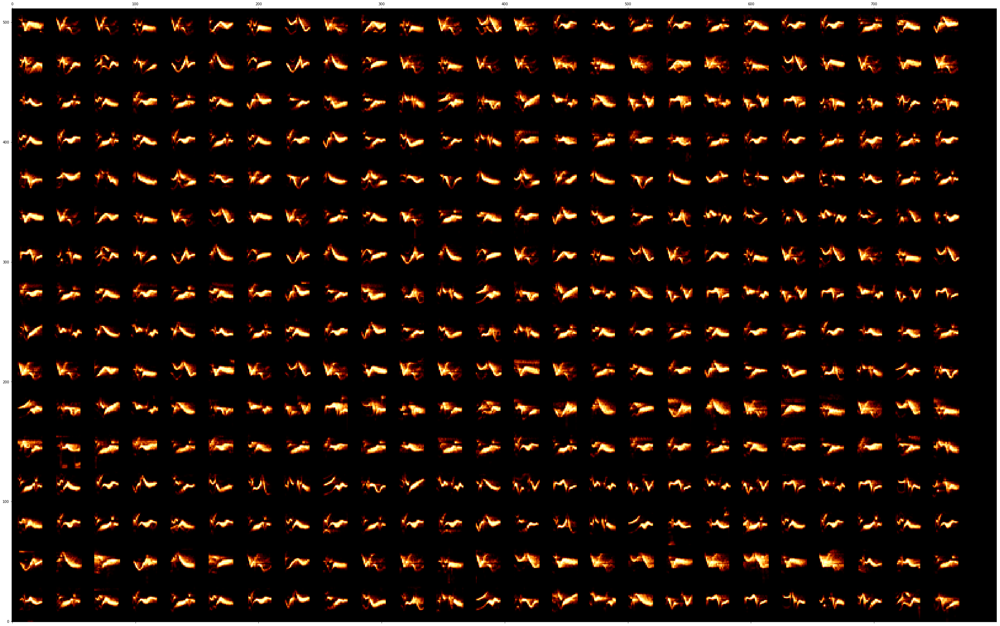

AGO 4595
(50.0, 32) (512, 800) 25.0 32 800


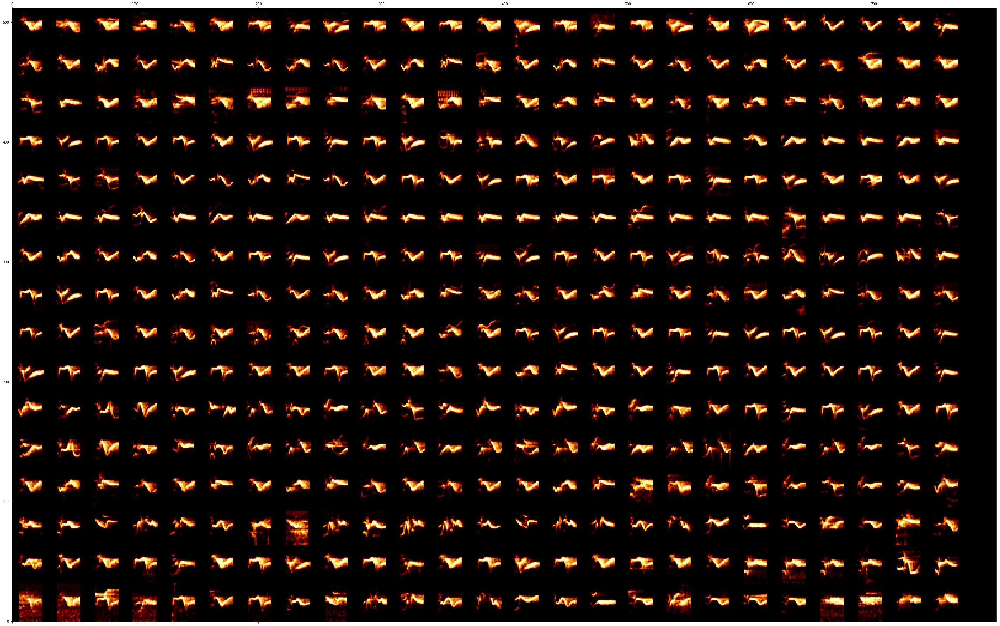

AOBu 7704
(50.0, 32) (512, 800) 25.0 32 800


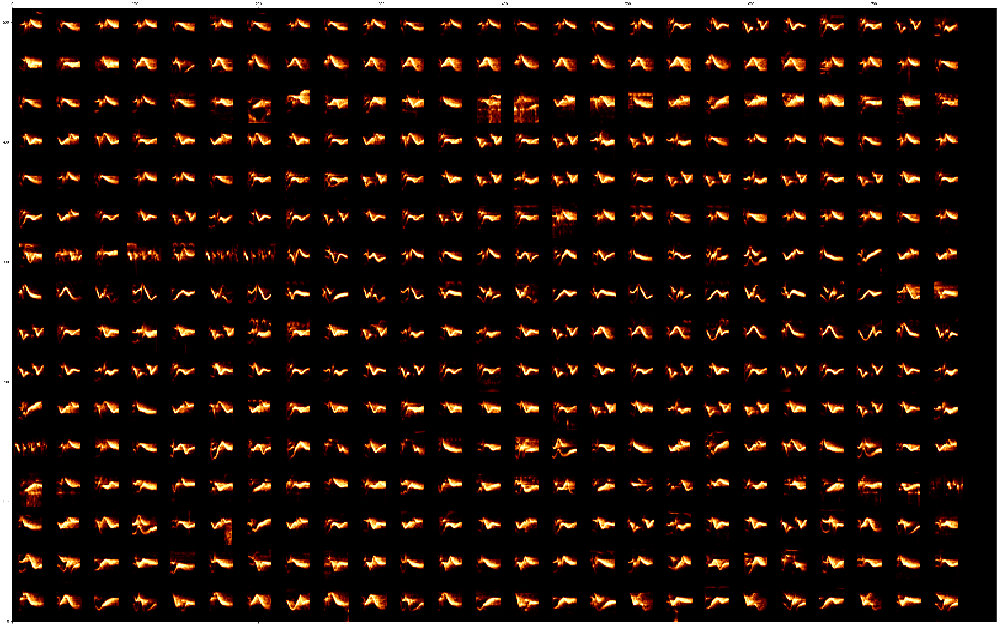

AYO 1543
(50.0, 32) (512, 800) 25.0 32 800


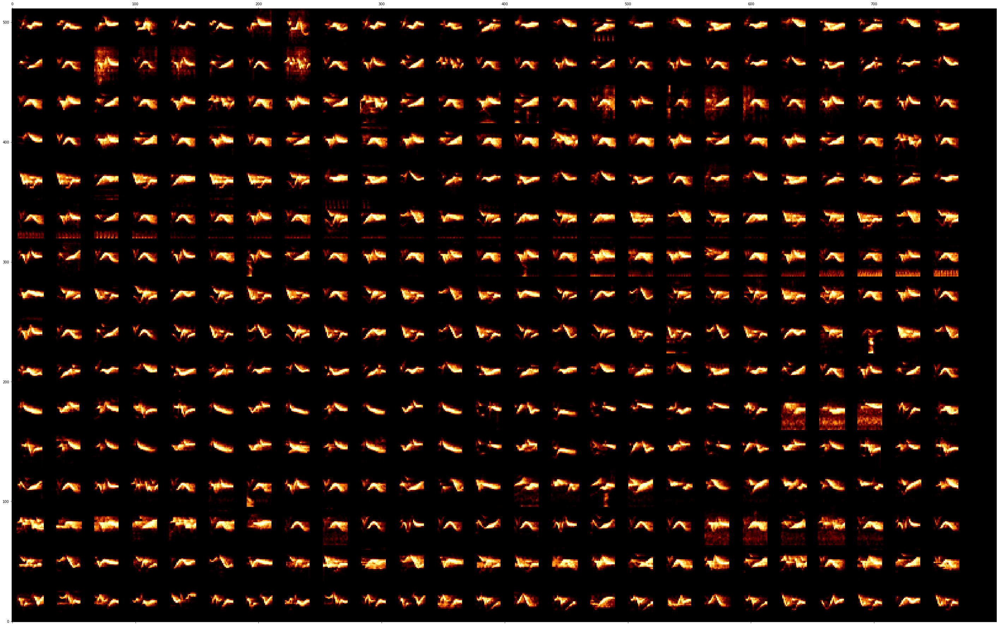

BuRA 5527
(50.0, 32) (512, 800) 25.0 32 800


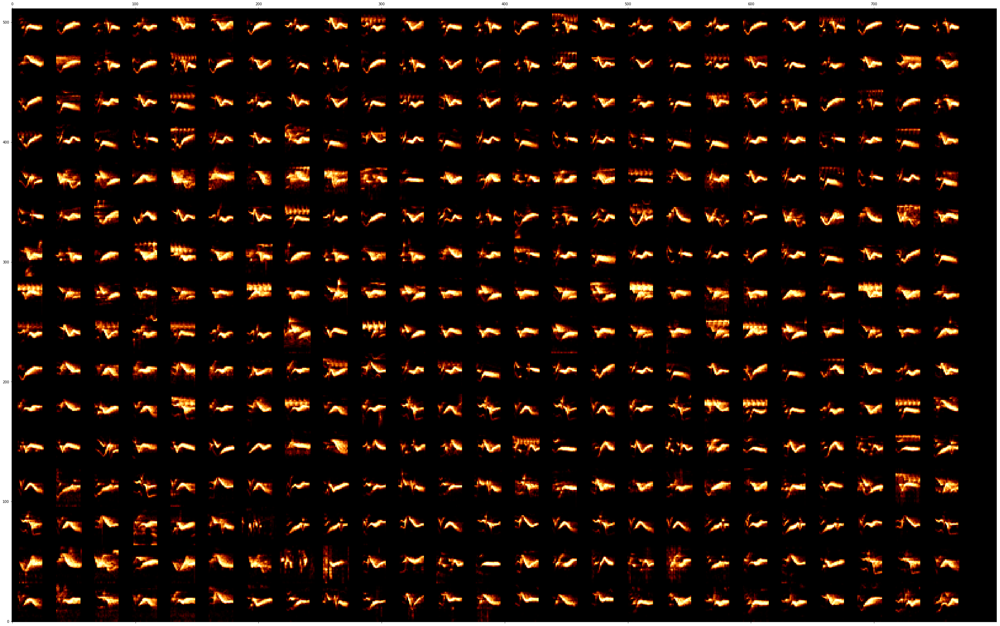

CAVI 134
(50.0, 12) (192, 800) 25.0 32 800


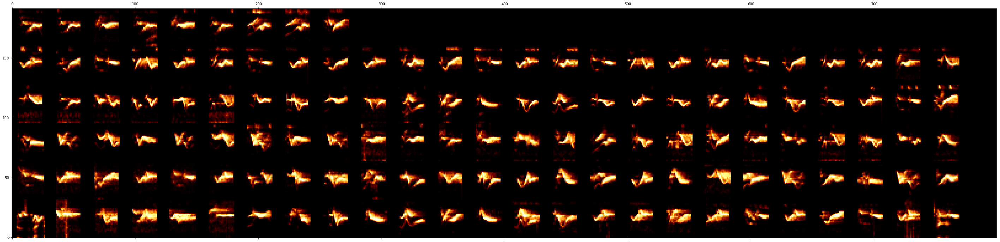

CAVI East Workshop 12 18
(50.0, 2) (32, 800) 25.0 32 800


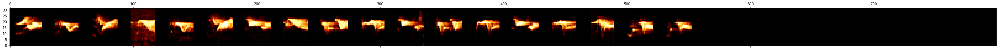

CAVI North Workshop 12 97
(50.0, 8) (128, 800) 25.0 32 800


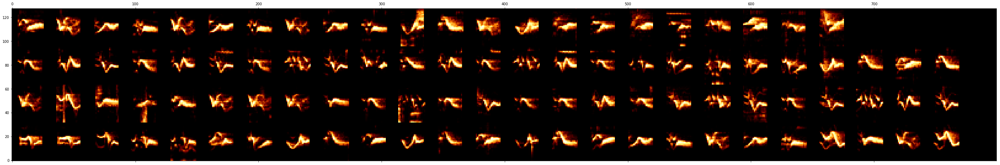

CAVIEast11 of Little house 548
(50.0, 32) (512, 800) 25.0 32 800


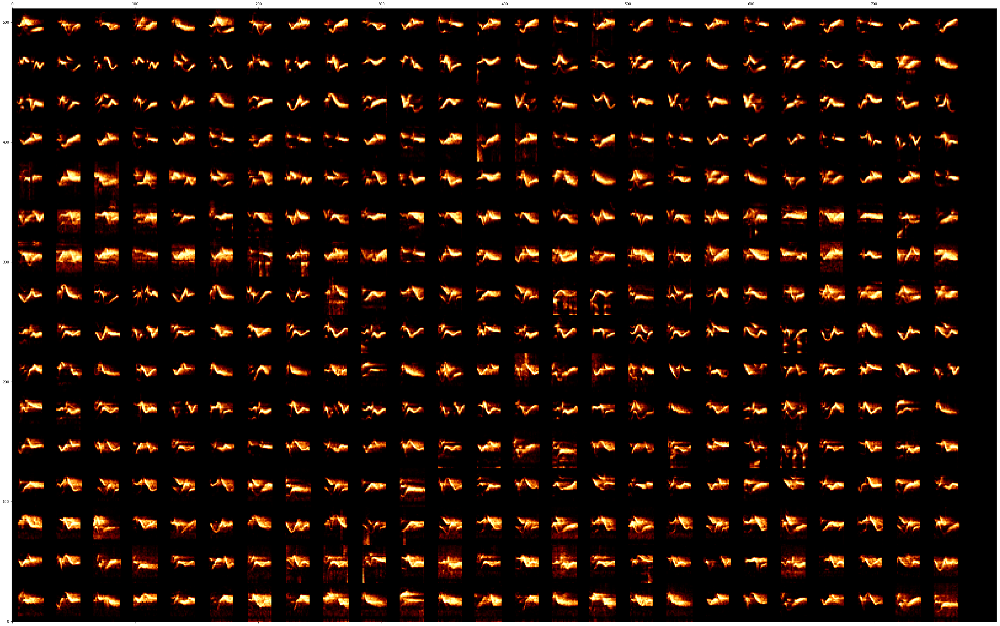

CAVIFTANN-LSpr12 315
(50.0, 26) (416, 800) 25.0 32 800


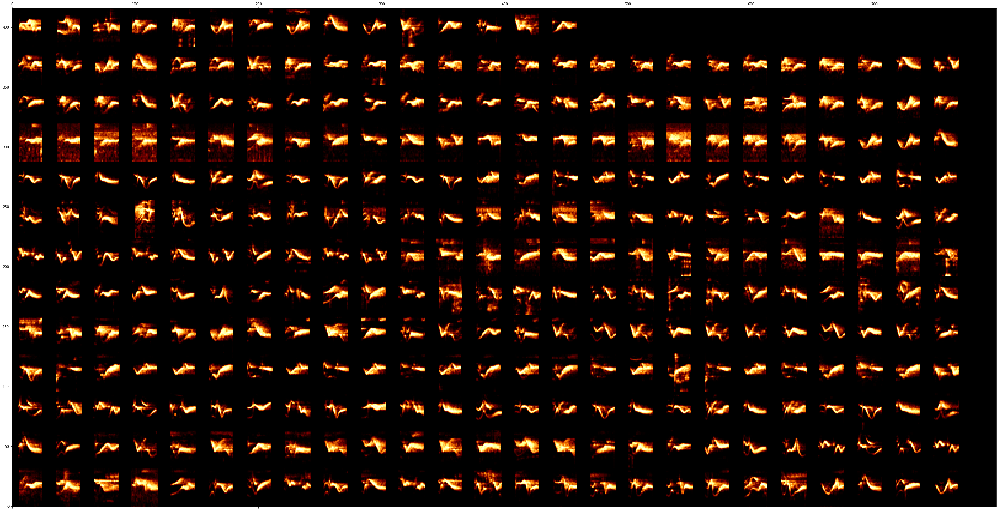

CAVIFTANN-Mine10 30
(50.0, 4) (64, 800) 25.0 32 800


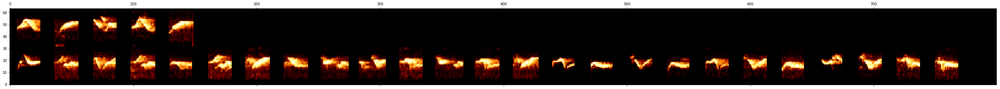

CAVIFTANN-Spingr10 1009
(50.0, 32) (512, 800) 25.0 32 800


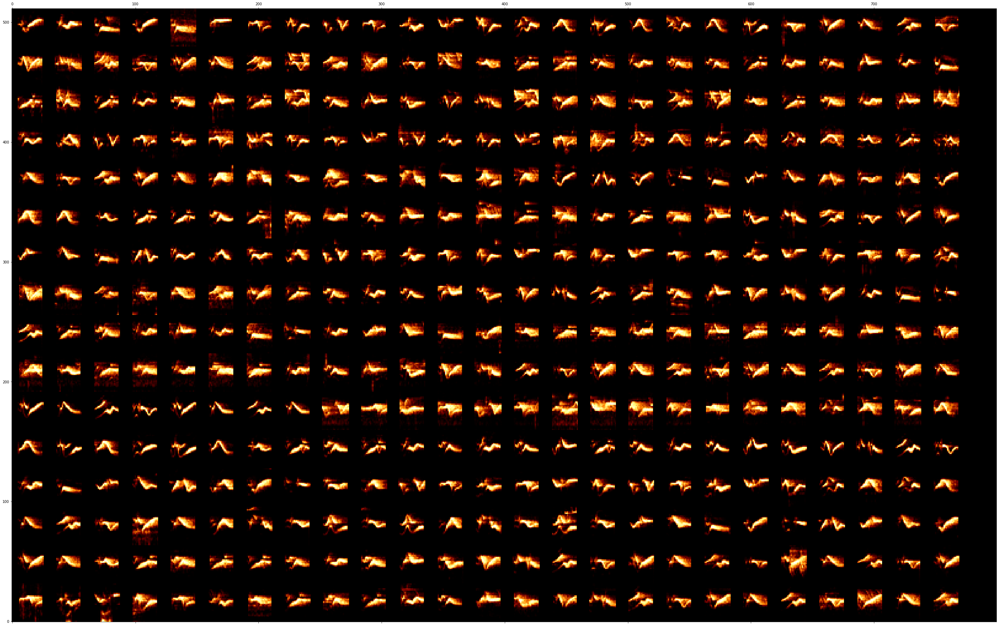

CAVIMine 12 228
(50.0, 20) (320, 800) 25.0 32 800


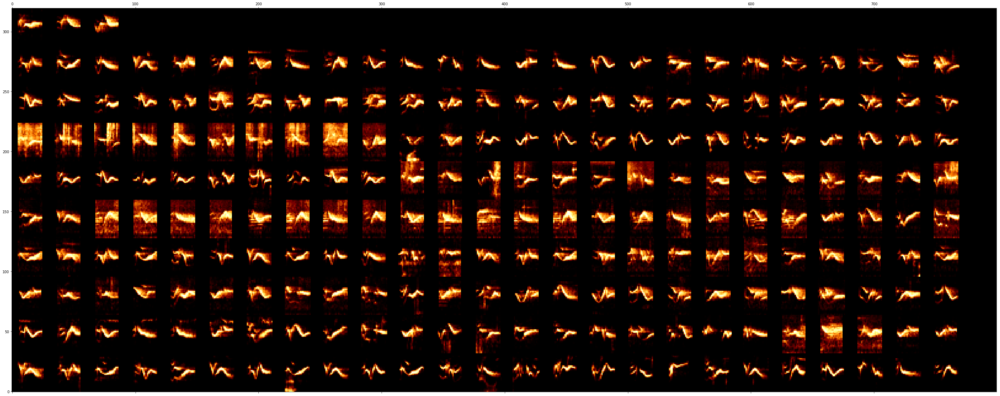

CAVIWest11 of little house 305
(50.0, 26) (416, 800) 25.0 32 800


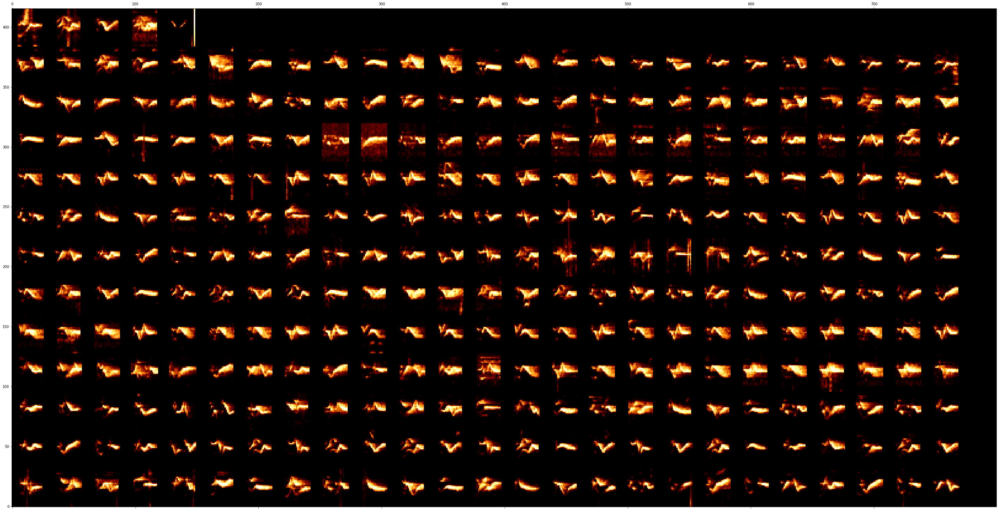

GAY 1068
(50.0, 32) (512, 800) 25.0 32 800


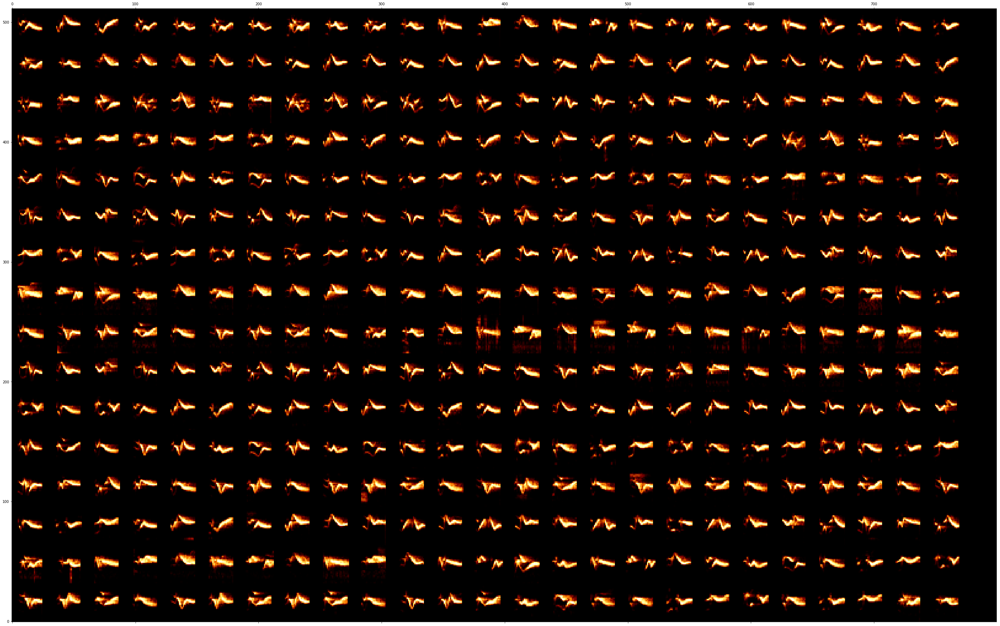

GRA 3045
(50.0, 32) (512, 800) 25.0 32 800


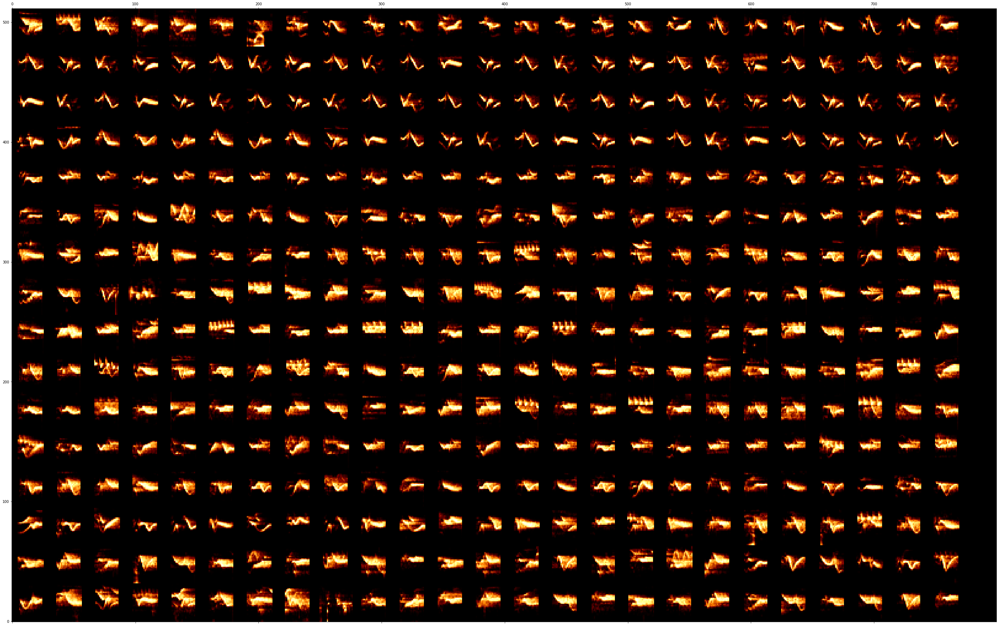

Gate CAVI 1136
(50.0, 32) (512, 800) 25.0 32 800


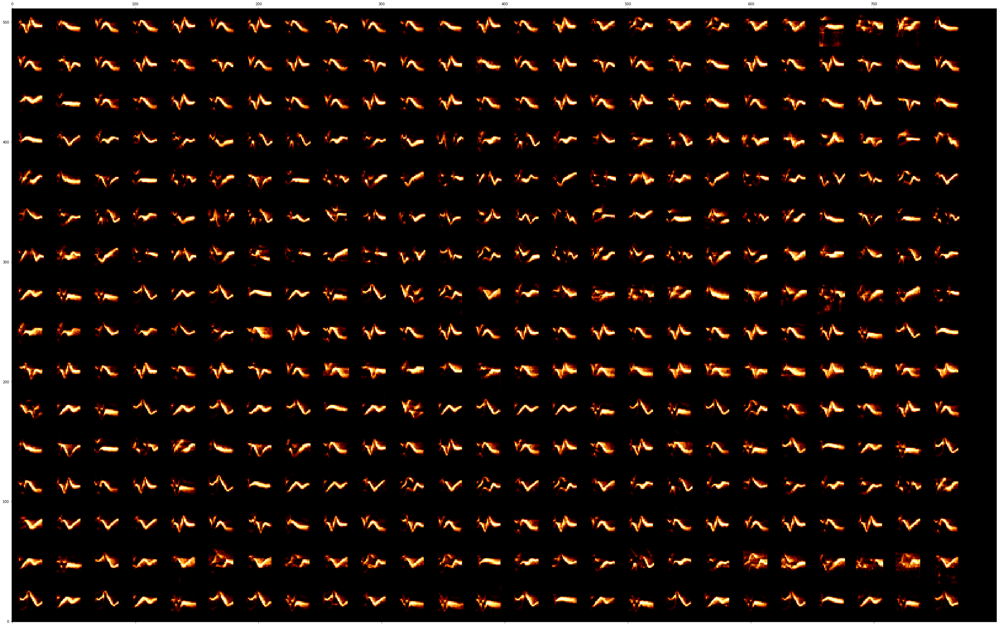

Meadow 1515
(50.0, 32) (512, 800) 25.0 32 800


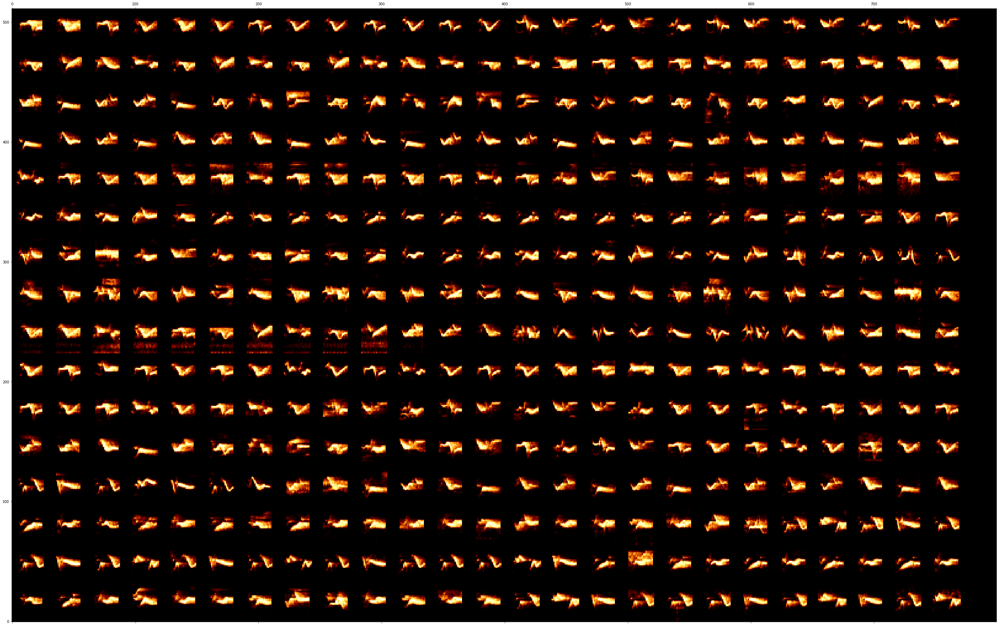

Mosquito Ridge 1 37
(50.0, 4) (64, 800) 25.0 32 800


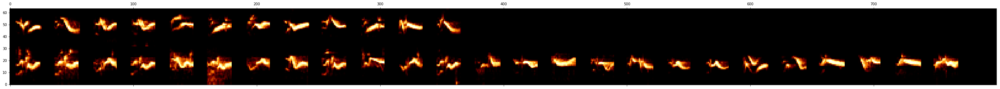

Mosquito Ridge 2 360
(50.0, 30) (480, 800) 25.0 32 800


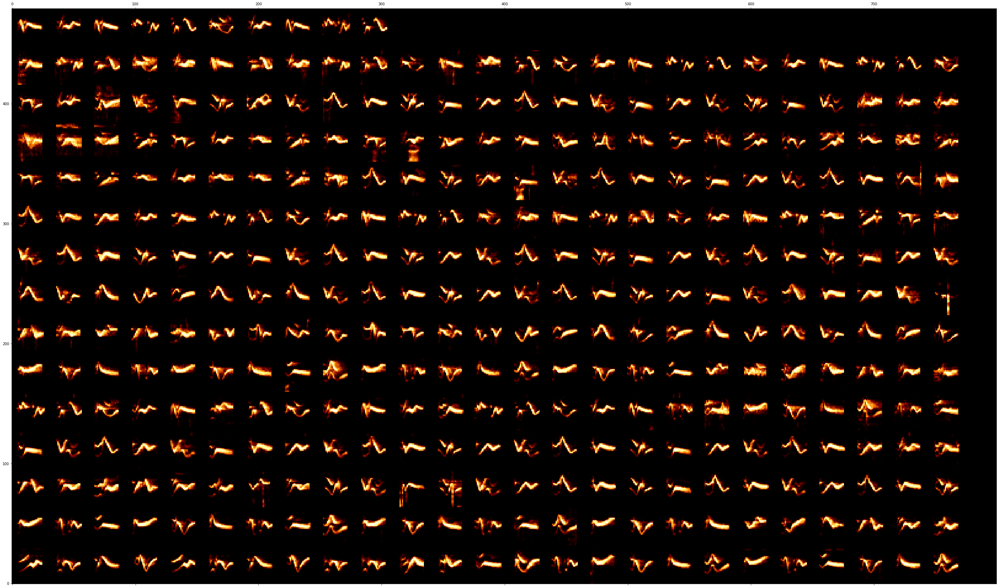

Mosquito Ridge 3 323
(50.0, 26) (416, 800) 25.0 32 800


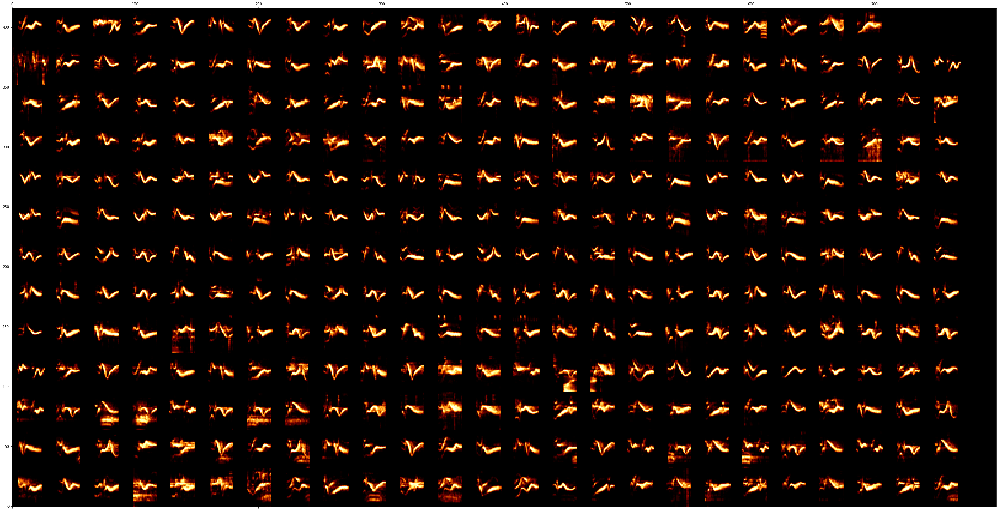

Mosquito Ridge 4 98
(50.0, 8) (128, 800) 25.0 32 800


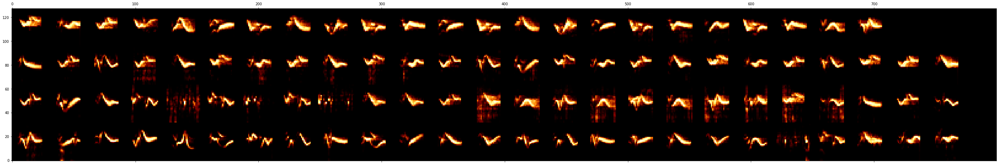

Mumford Bar Trail 1 259
(50.0, 22) (352, 800) 25.0 32 800


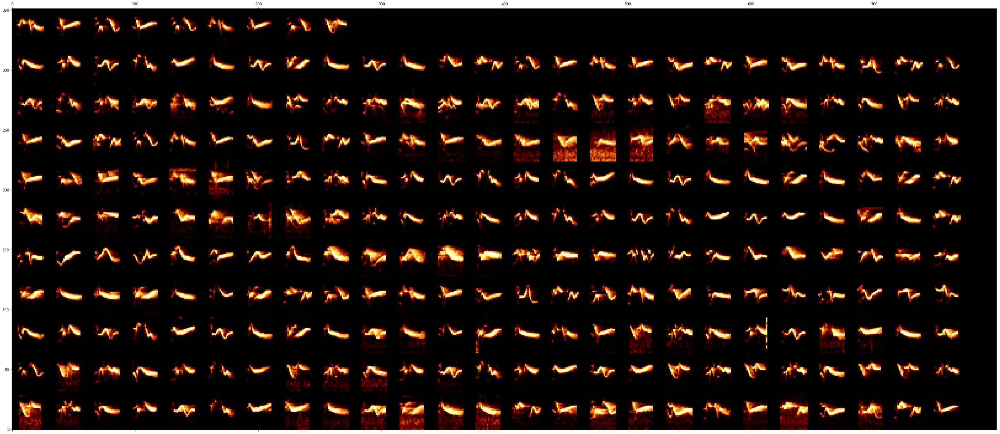

Mumford Bar Trail 2 555
(50.0, 32) (512, 800) 25.0 32 800


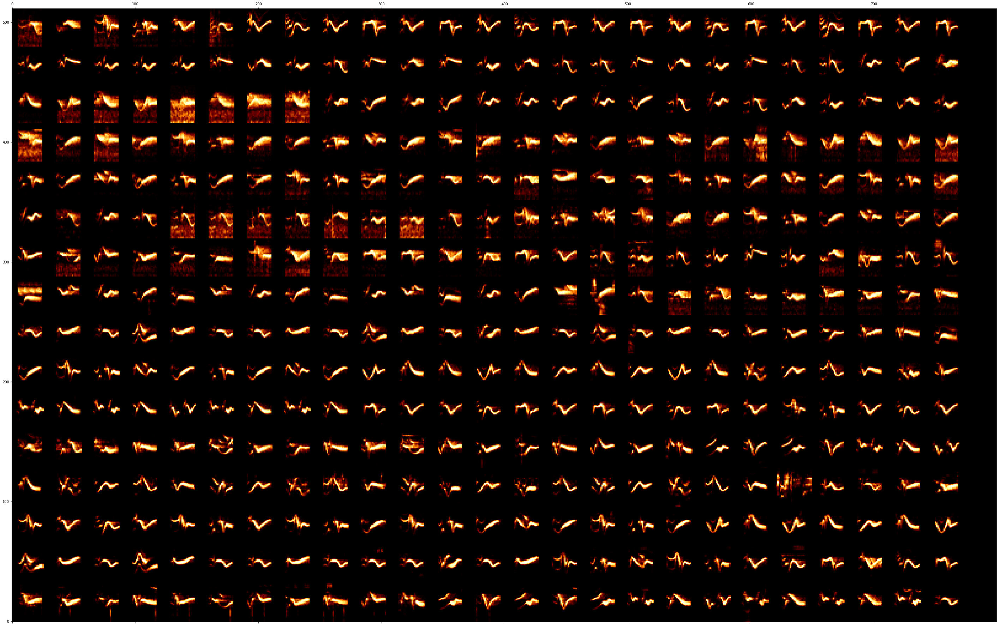

Mumford Bar Trail 3 136
(50.0, 12) (192, 800) 25.0 32 800


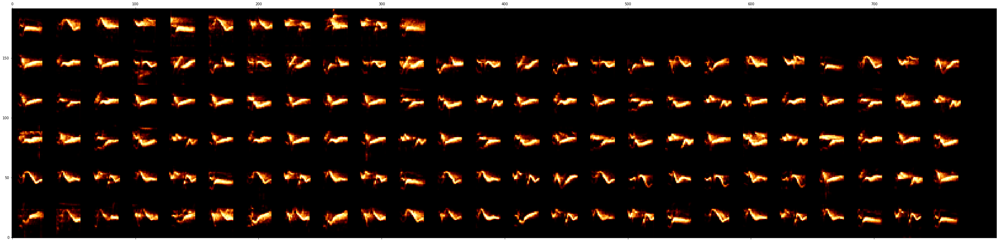

Mumford Bar Trail 4 482
(50.0, 32) (512, 800) 25.0 32 800


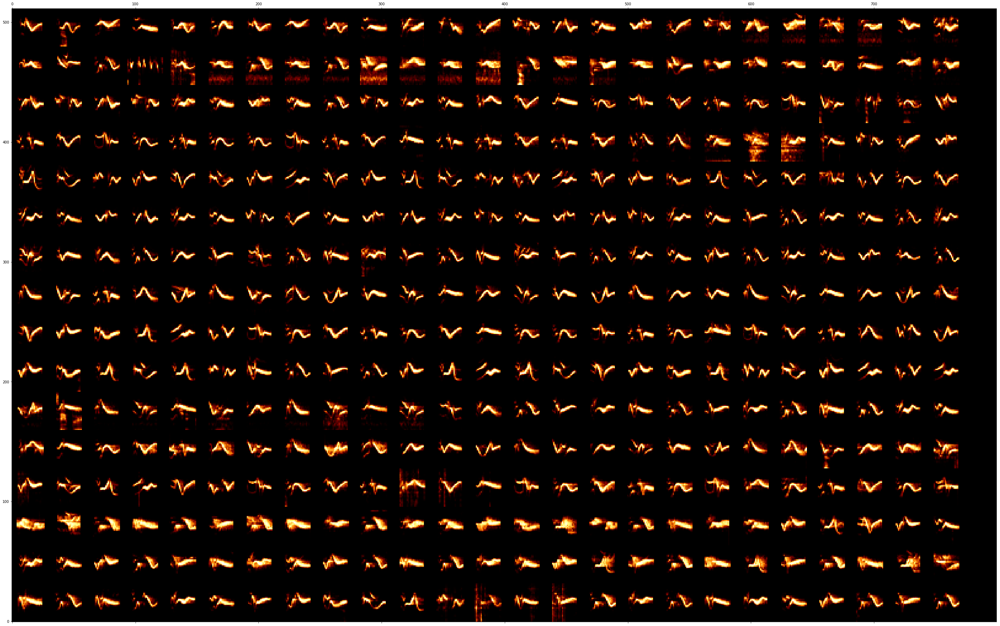

Mumford Bar Trail 5 117
(50.0, 10) (160, 800) 25.0 32 800


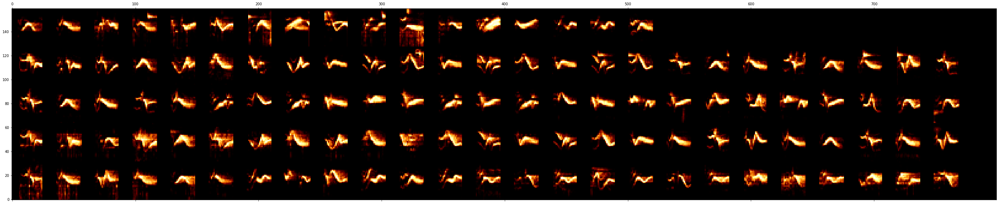

Mumford Bar Trail 6 187
(50.0, 16) (256, 800) 25.0 32 800


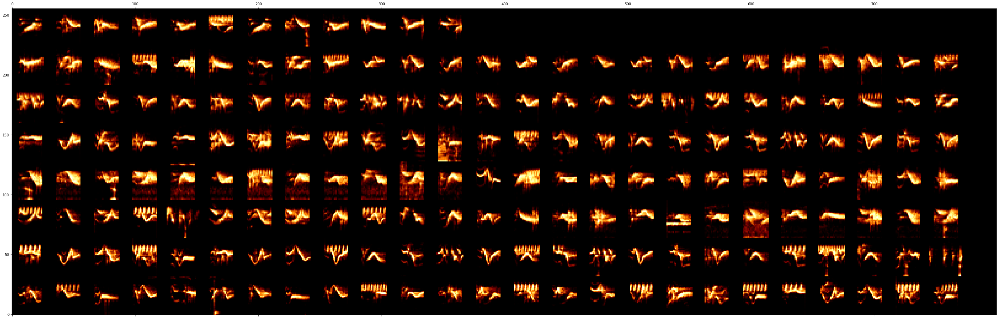

Mumford Bar Trail 7 128
(50.0, 12) (192, 800) 25.0 32 800


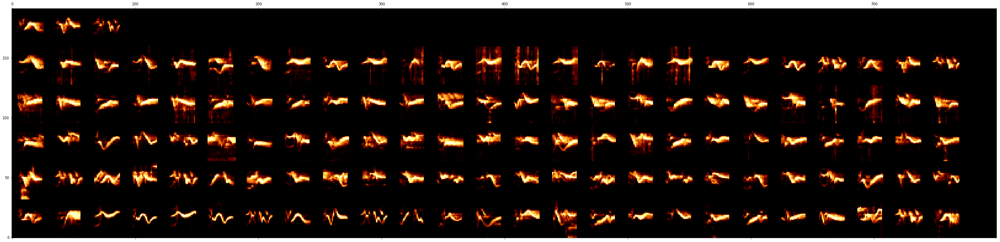

Mumford Bar Trail 8 3
(50.0, 2) (32, 800) 25.0 32 800


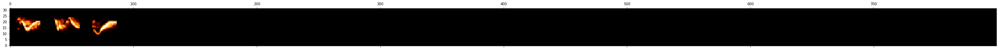

Mumford Bar Trail 9 32
(50.0, 4) (64, 800) 25.0 32 800


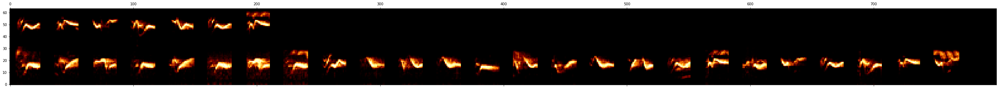

New unbanded 137
(50.0, 12) (192, 800) 25.0 32 800


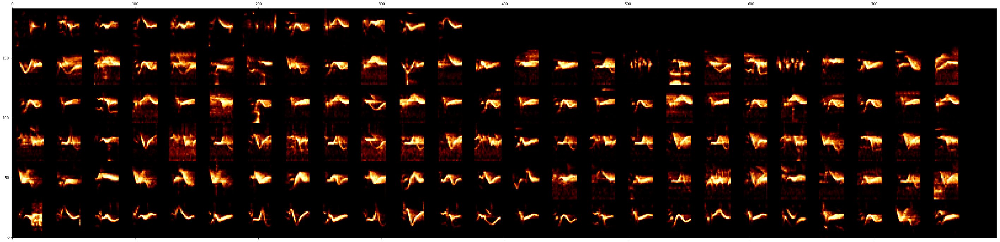

North South Rd 1 346
(50.0, 28) (448, 800) 25.0 32 800


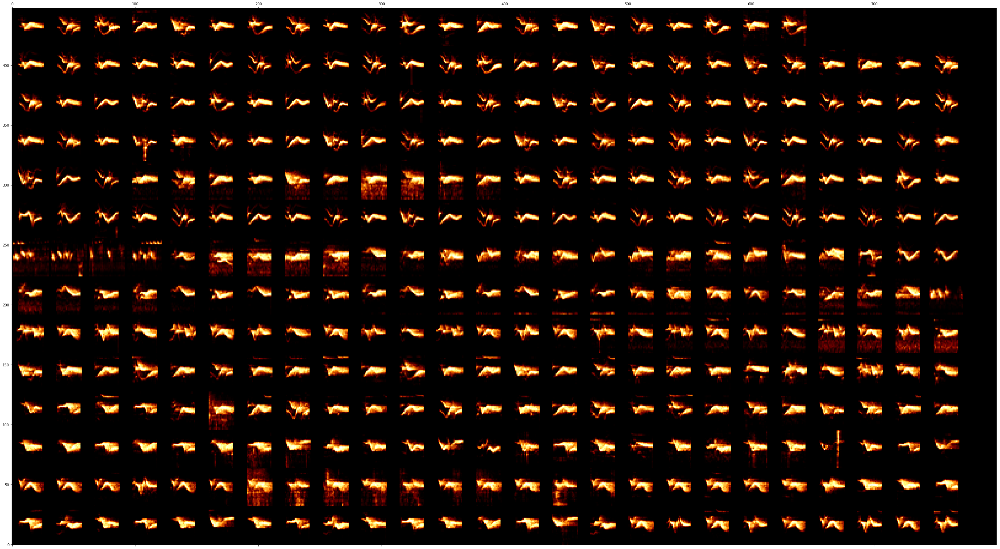

ORA 2805
(50.0, 32) (512, 800) 25.0 32 800


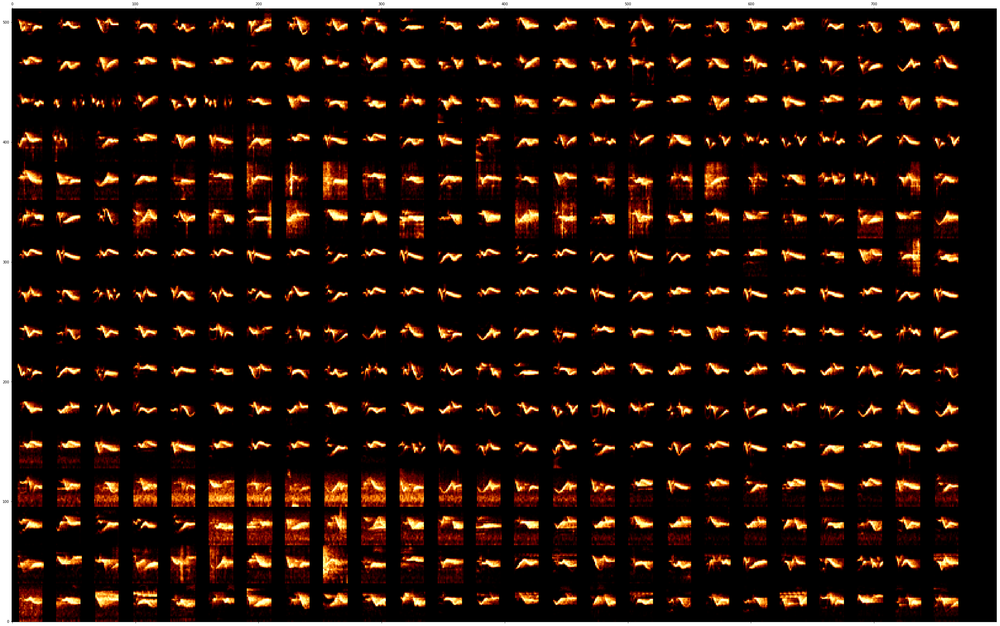

Omo Ranch Rd 1 238
(50.0, 20) (320, 800) 25.0 32 800


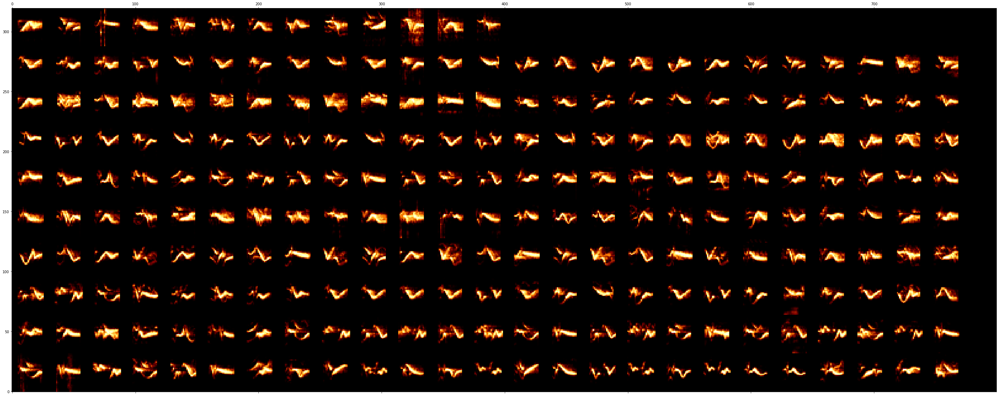

Omo Ranch Rd 2 368
(50.0, 30) (480, 800) 25.0 32 800


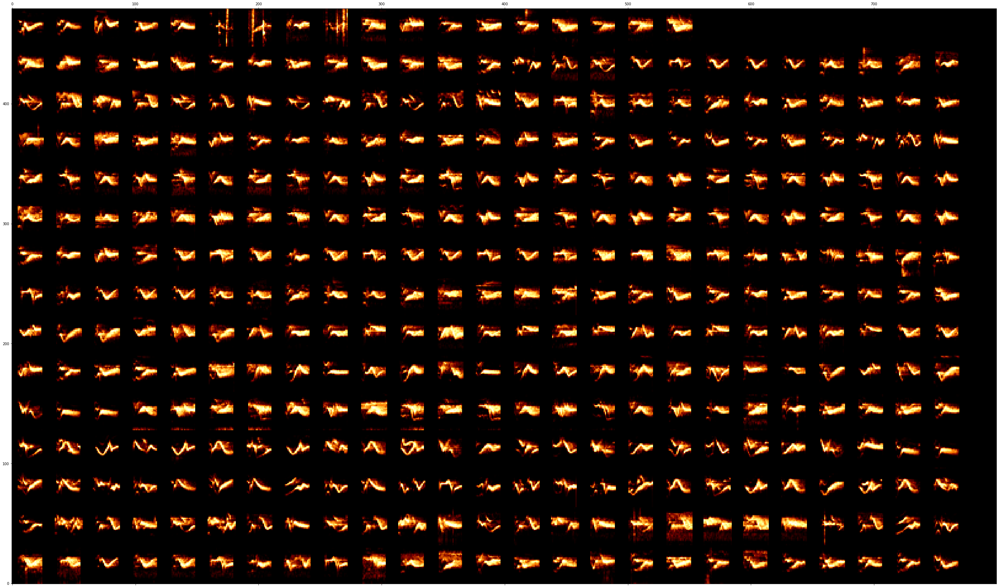

Omo Ranch Rd 3 41
(50.0, 4) (64, 800) 25.0 32 800


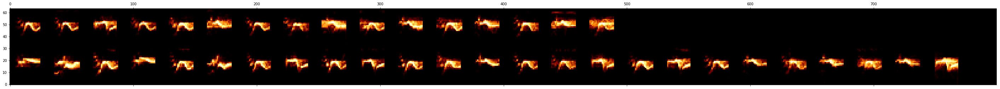

Omo Ranch Rd 4 10
(50.0, 2) (32, 800) 25.0 32 800


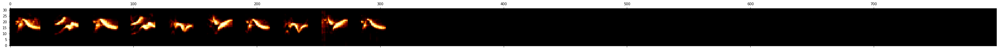

RYA 3582
(50.0, 32) (512, 800) 25.0 32 800


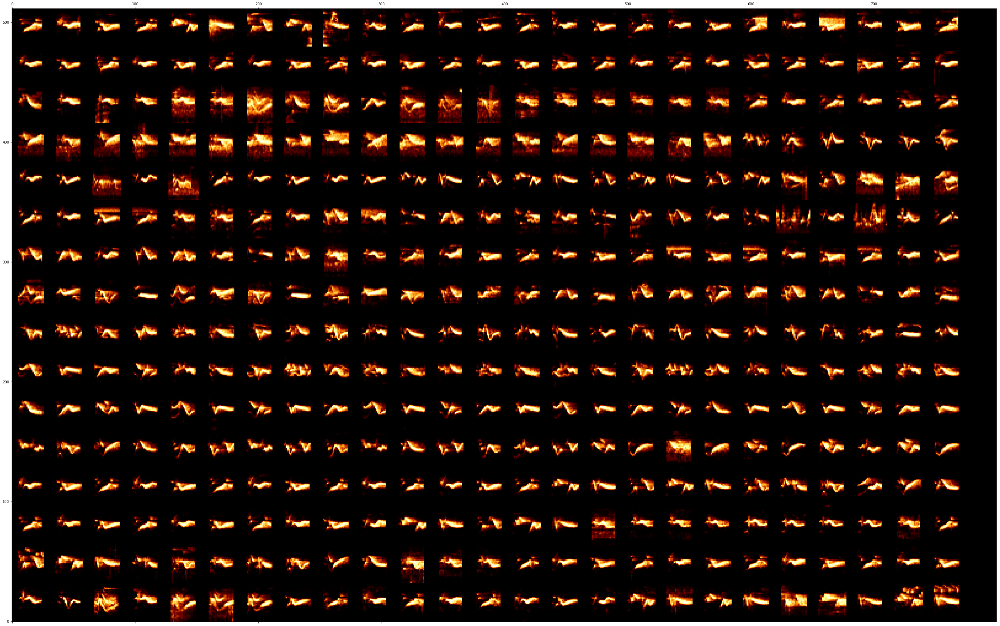

Sailor Flat 65
(50.0, 6) (96, 800) 25.0 32 800


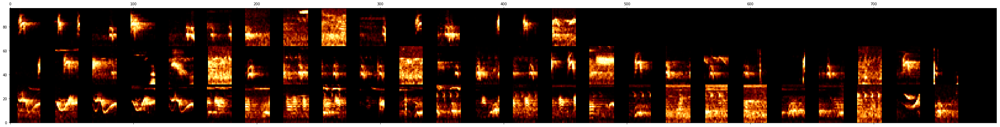

Unbanded East 2324
(50.0, 32) (512, 800) 25.0 32 800


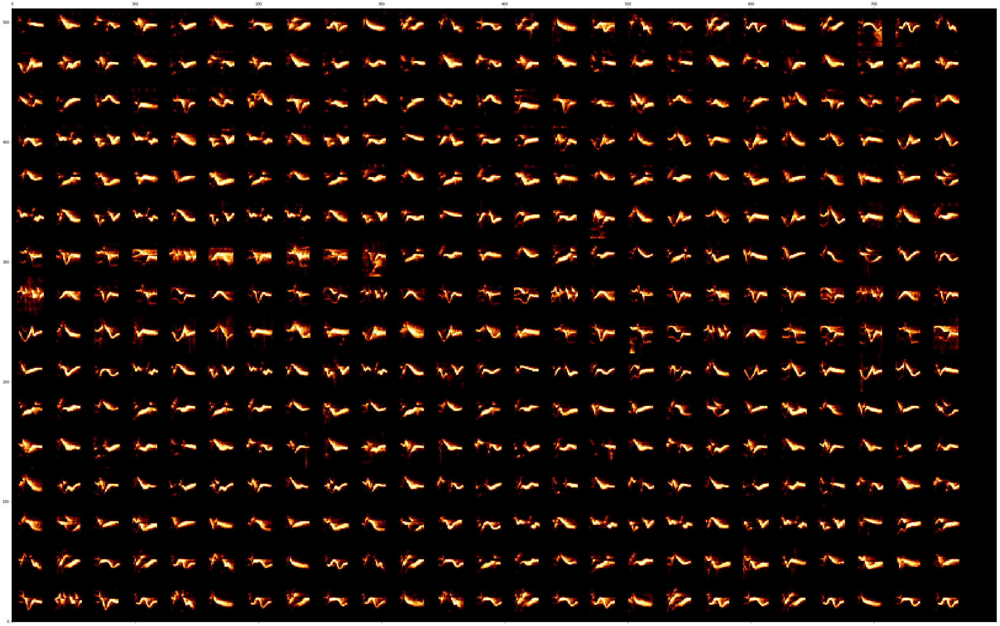

UpperSpring CAVI12 266
(50.0, 22) (352, 800) 25.0 32 800


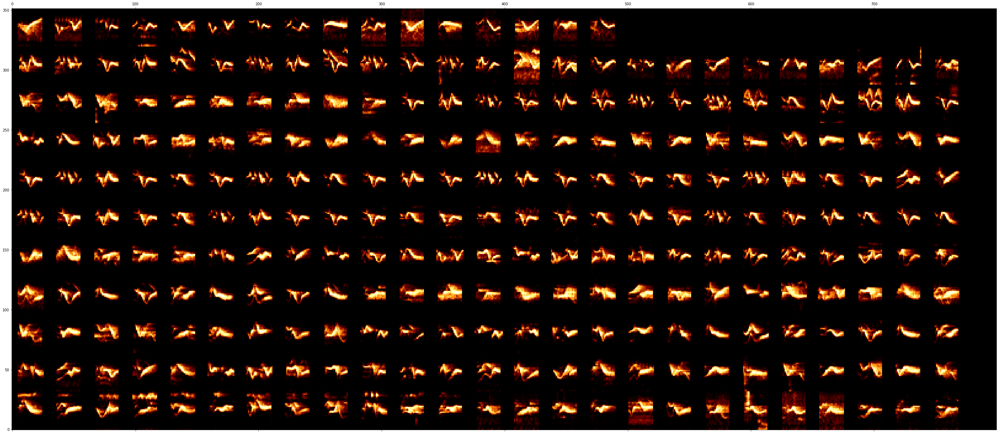

WABk 7373
(50.0, 32) (512, 800) 25.0 32 800


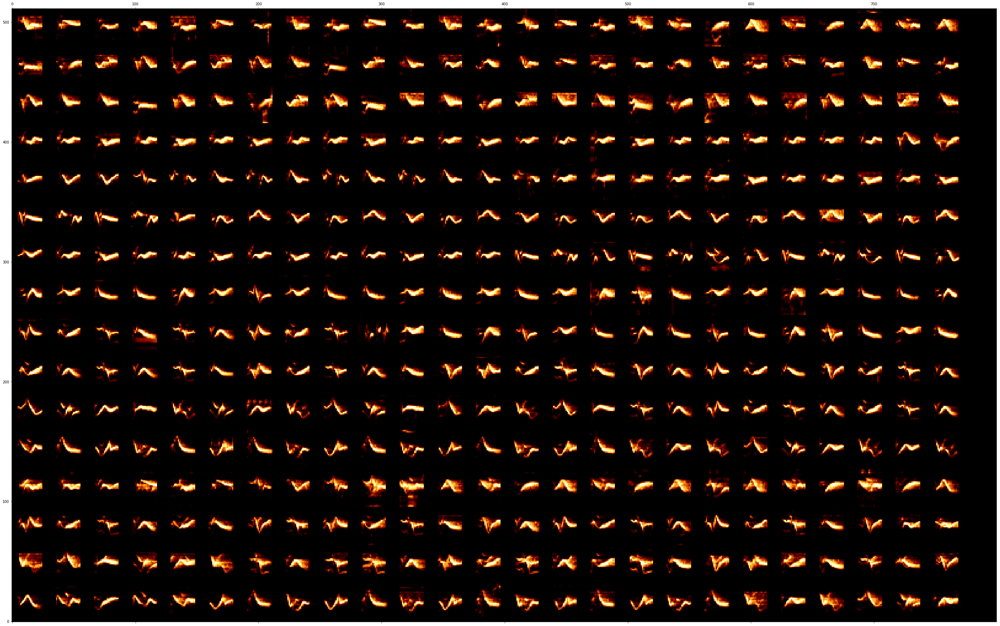

YAW 3422
(50.0, 32) (512, 800) 25.0 32 800


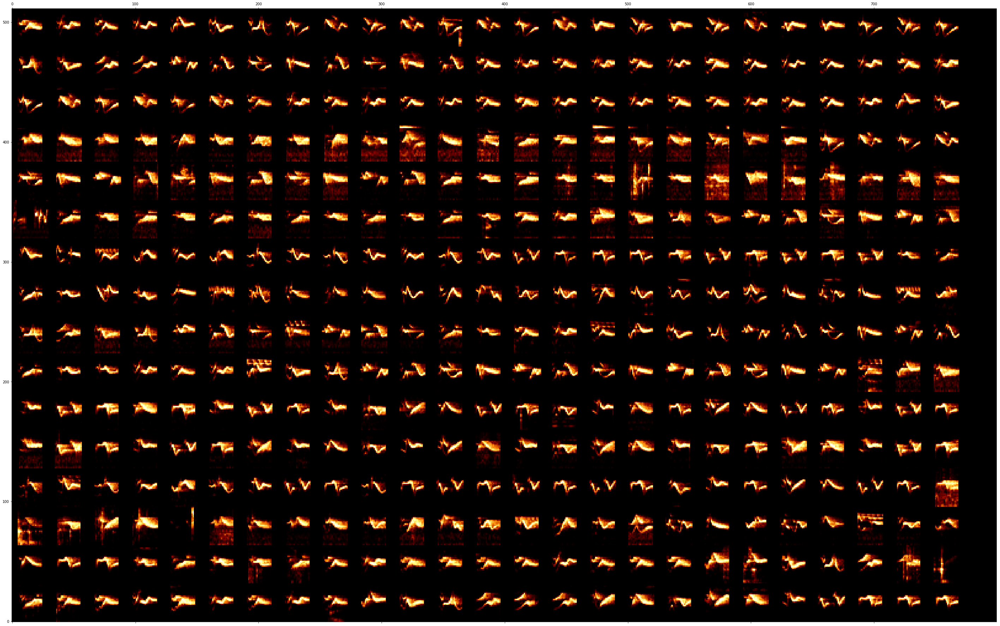

YBuA 2638
(50.0, 32) (512, 800) 25.0 32 800


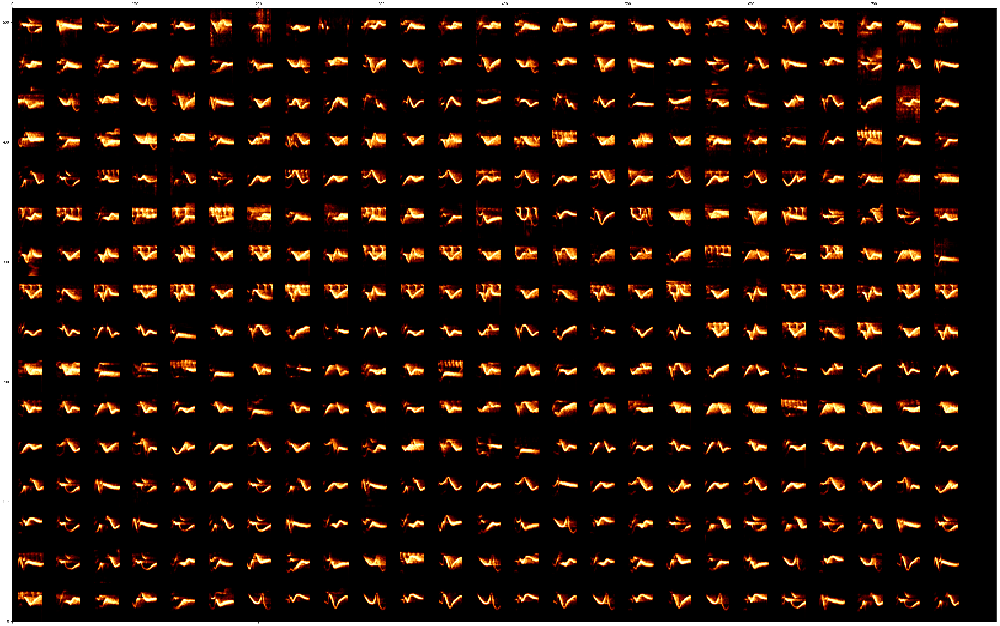

two CAVI 583
(50.0, 32) (512, 800) 25.0 32 800


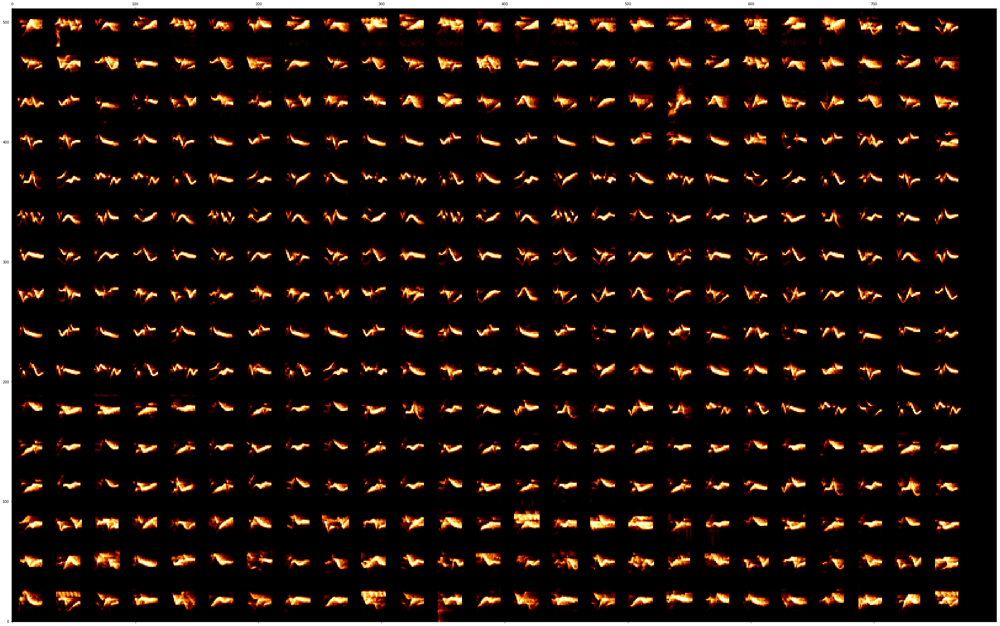

two_males 734
(50.0, 32) (512, 800) 25.0 32 800


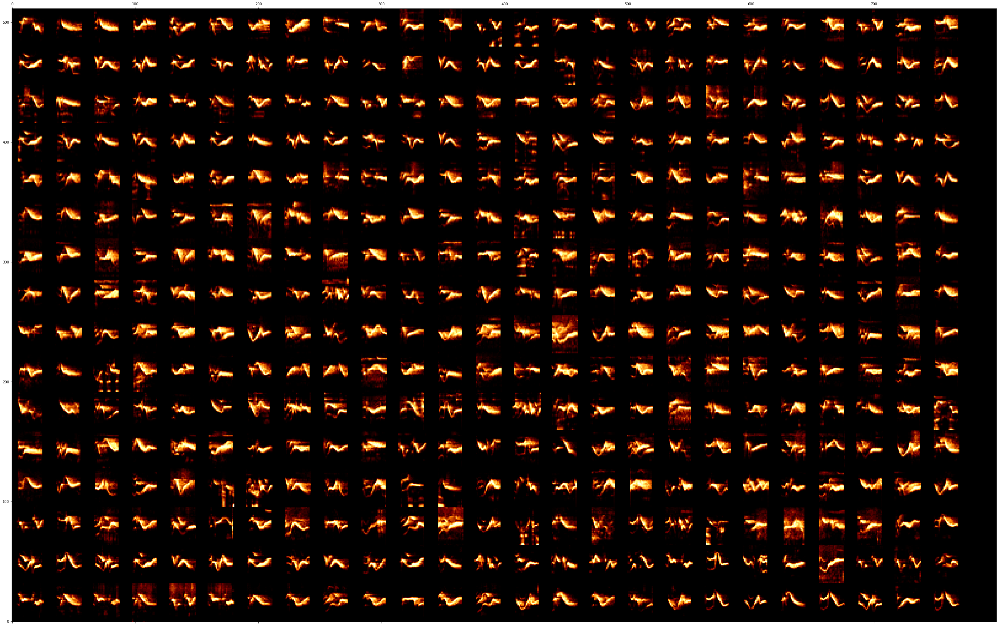

In [38]:
for indv in np.sort(syllable_df.indv.unique()):
    print(indv, np.sum(syllable_df.indv == indv))
    specs = np.array([i/np.max(i) for i in syllable_df[syllable_df.indv == indv].spectrogram.values])
    specs[specs<0] = 0
    draw_spec_set(specs, zoom=2,
                  maxrows=16, 
                  colsize=25)

### save dataset

In [39]:
save_loc = DATA_DIR / 'syllable_dfs' / DATASET_ID / 'cassins.pickle'
ensure_dir(save_loc)
syllable_df.to_pickle(save_loc)